In [1]:
from __future__ import print_function
#%matplotlib inline
import argparse # parse cmd argumemts
import os # os
import random # random numbers
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [2]:
from config import cfg

cfg

{'num_gpus': 1,
 'Z_dim': 100,
 'img_channels': 3,
 'generator_depth': 64,
 'discriminator_depth': 64,
 'num_epochs': 10,
 'opt_lr': 0.0002,
 'adam_beta1': 0.5,
 'batch_size': 64,
 'workers': 5,
 'data_root': '../data/anime'}

In [3]:
# I forgot to specify image size in the original thing but its whatever
image_size = 64
batch_size = cfg["batch_size"]
workers = cfg["workers"]
ngpu = cfg["num_gpus"]

dataset = dset.ImageFolder(root=cfg["data_root"],
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
print(device)

cuda


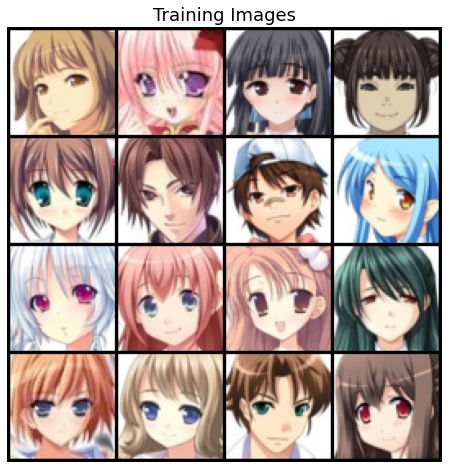

In [4]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images", fontsize=18)
# I think imshow automatically adjusts numbers to be 0-255 or whatever.
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:16], # take 16 training imgs
                                         nrow=4, # display 4 per row
                                         padding=2, # pads each image
                                         normalize=True # shift image to range(0, 1)
                                         ).cpu(),(1,2,0))) # transpose switches the axes around
                                         # before it was C x W x H, now it's W x H x C cuz plt likes that

In [5]:
# custom weights initialization called on netG and netD
# we're gonna use the apply() method with this later, which will recursively apply this to every submodule(layer)
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1: # if it's a conv layer
        nn.init.normal_(m.weight.data, 0.0, 0.02) # normal fills input tensor with numbers from normal distribution
        # so this fills all the weight data with normal values.
    elif classname.find('BatchNorm') != -1:
        # if we have a batchnorm layer, fill weights with normal, bias with 0
        nn.init.normal_(m.weight.data, 1.0, 0.02) # bn default weight is 1. Generating from N(0, 0.02) doesn't make sense.
        nn.init.constant_(m.bias.data, 0)

In [6]:
from net import Generator, Discriminator

In [7]:
netG = Generator().to(device)
netG.apply(weights_init)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [8]:
# Create the Discriminator
netD = Discriminator().to(device)
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [9]:
beta1 = cfg["adam_beta1"]
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
# THIS IS USED FOR VISUALIZING HOW THINGS ARE GOING, NOT FOR ANY ACTUAL TRAINING
fixed_noise = torch.randn(16, cfg["Z_dim"], 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=cfg["opt_lr"], betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=cfg["opt_lr"], betas=(beta1, 0.999))

The reason why D(x) should go 1 --> 0.5 is originally discriminator should know the images are real, eventually it shouldn't know whether the real images are real or generated.

Similar idea for D(G(x)) --> should originally be 0, then eventually discriminator doesn't know if generated images are real or fake(0.5)

In [11]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0
num_epochs = 10
nz = cfg["Z_dim"]

print("Starting Training Loop...")
info_dict = {"Loss_D": "BCELoss 0f D after training discriminator(current batch)",
            "Loss_G": "BCELoss of D after training generator(current batch)",
            "D(x)": "proportion of real labels given by D on real images(should go 1 --> 0.5)",
            "D(G(x))": "proportion of real labls given by G on fake images before/after D is updated(should go 0 --> 0.5)"}
# ok I was going to print everything in infodict but I forgot to add the line...

netD.train()
netG.train()
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0): # this will enumerate the iterations coming out of the dataloader

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device) # just the images, no labels
        b_size = real_cpu.size(0) # size of batch, so we can generate labels
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device) # filled tensor with real_label(1)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # so BASICALLY view makes sure the tensor is 1 dimensional, just like flattens it.
        # because our label is (b_size,), so we need to match that shape.
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1) # detach detaches fake from gradient calculations cuz we don't want that rn.
        # so this way, we don't update the generator weights while training the discrimminator
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        # collect statistic proportion of real/false predictions, just for reporting
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch+1, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, nrow=4, padding=2, normalize=True))
        
        torch.save(netG.state_dict(), f"netG_{epoch}.pth")
        torch.save(netD.state_dict(), f"netD_{epoch}.pth")
        
        iters += 1
print("Done, setting models to eval mode. REMEMBER TO USE TORCH.NO_GRAD WHEN GENERATING THINGS TO GO FASTER!!")
netD.eval()
netG.eval()

Starting Training Loop...
[1/10][0/795]	Loss_D: 1.9174	Loss_G: 3.8148	D(x): 0.3887	D(G(z)): 0.4997 / 0.0291
[1/10][50/795]	Loss_D: 1.1343	Loss_G: 22.6788	D(x): 0.9881	D(G(z)): 0.4088 / 0.0000
[1/10][100/795]	Loss_D: 0.6545	Loss_G: 6.9407	D(x): 0.8743	D(G(z)): 0.3093 / 0.0026
[1/10][150/795]	Loss_D: 0.2363	Loss_G: 5.9734	D(x): 0.8920	D(G(z)): 0.0701 / 0.0037
[1/10][200/795]	Loss_D: 0.1545	Loss_G: 5.3685	D(x): 0.9194	D(G(z)): 0.0130 / 0.0178
[1/10][250/795]	Loss_D: 0.8680	Loss_G: 7.7008	D(x): 0.7973	D(G(z)): 0.2995 / 0.0012
[1/10][300/795]	Loss_D: 0.4812	Loss_G: 7.5695	D(x): 0.9021	D(G(z)): 0.2618 / 0.0011
[1/10][350/795]	Loss_D: 0.3528	Loss_G: 4.6470	D(x): 0.8810	D(G(z)): 0.1779 / 0.0144
[1/10][400/795]	Loss_D: 1.2084	Loss_G: 9.7203	D(x): 0.4133	D(G(z)): 0.0005 / 0.0008
[1/10][450/795]	Loss_D: 0.8299	Loss_G: 7.6779	D(x): 0.9306	D(G(z)): 0.4505 / 0.0012
[1/10][500/795]	Loss_D: 1.0988	Loss_G: 10.4014	D(x): 0.5231	D(G(z)): 0.0002 / 0.0001
[1/10][550/795]	Loss_D: 0.6081	Loss_G: 5.8046	D(x):

[7/10][100/795]	Loss_D: 0.3348	Loss_G: 2.6066	D(x): 0.8015	D(G(z)): 0.0595 / 0.1069
[7/10][150/795]	Loss_D: 0.5042	Loss_G: 2.3052	D(x): 0.7507	D(G(z)): 0.1153 / 0.1608
[7/10][200/795]	Loss_D: 0.1449	Loss_G: 5.4029	D(x): 0.9340	D(G(z)): 0.0614 / 0.0092
[7/10][250/795]	Loss_D: 0.4125	Loss_G: 3.4451	D(x): 0.7127	D(G(z)): 0.0070 / 0.0556
[7/10][300/795]	Loss_D: 0.6330	Loss_G: 2.1374	D(x): 0.6239	D(G(z)): 0.0072 / 0.1744
[7/10][350/795]	Loss_D: 0.3719	Loss_G: 5.6934	D(x): 0.9600	D(G(z)): 0.2456 / 0.0057
[7/10][400/795]	Loss_D: 0.1850	Loss_G: 3.7996	D(x): 0.8842	D(G(z)): 0.0471 / 0.0375
[7/10][450/795]	Loss_D: 0.2373	Loss_G: 4.3946	D(x): 0.9012	D(G(z)): 0.1064 / 0.0172
[7/10][500/795]	Loss_D: 0.3480	Loss_G: 6.8176	D(x): 0.9675	D(G(z)): 0.2457 / 0.0017
[7/10][550/795]	Loss_D: 0.3738	Loss_G: 4.6669	D(x): 0.7517	D(G(z)): 0.0146 / 0.0175
[7/10][600/795]	Loss_D: 0.2772	Loss_G: 5.0348	D(x): 0.9444	D(G(z)): 0.1816 / 0.0101
[7/10][650/795]	Loss_D: 0.2318	Loss_G: 4.4397	D(x): 0.9234	D(G(z)): 0.1279 /

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

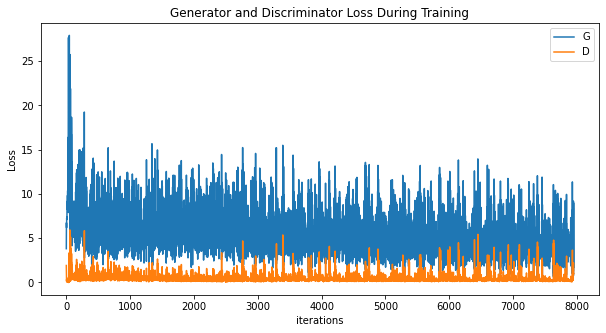

In [12]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

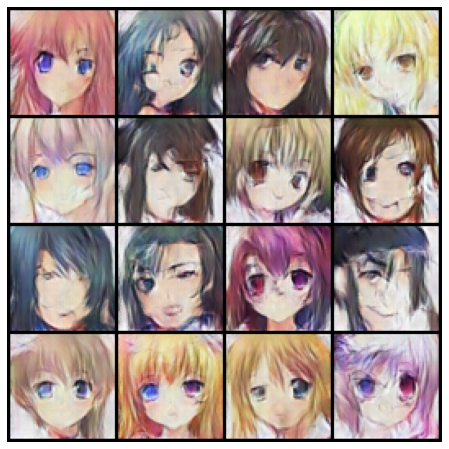

In [13]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())